In [593]:
import numpy as np
import matplotlib.pyplot as plt
import math

In [594]:
f0=2.25e6
c0=1500.0
u=1.0e3
p=1.0e3
w=2*math.pi*f0
lamd=c0/f0
k=2*math.pi/lamd

In [595]:
L = lamd/4
a = lamd/4
d = 2*lamd/3
r = 5e-2

In [596]:
F=5e-2

In [597]:
xis=math.pi/3
xi=math.pi/3
phi=0

In [598]:
N=32

In [599]:
rn = np.zeros(N)

In [600]:
def CalRn(r,n,d,xi,phi):
    res =  math.sqrt(r**2+(n*d)**2-2*r*(n*d)*math.sin(xi)*math.cos(phi))
    return res

In [601]:
def GetRn(r,d,xi,phi):
    for i in np.arange(0,N,1):
        rn[i]=CalRn(r,i,d,xi,phi)
        print(i,rn[i])
    return rn

In [ ]:
GetRn(r,d,xi,phi)

In [603]:
DetaTaun = np.zeros(N)
t0 = r/c0

In [ ]:
DetaTau0=d*math.sin(xis)/c0
DetaTau0

In [605]:
def CalDetaTn(n,F,xis):
    DetaTau0=d*math.sin(xis)/c0
    #print(DetaTau0)
    #res = n*DetaTau0+c0*DetaTau0**2/(2*F*((math.tan(xis))**2))*(n*N-n**2-n)
    res = n*DetaTau0+d**2*((math.cos(xis))**2)/(2*F*c0)*(n*N-n**2-n)
    return res

In [606]:
def GetDetaTn(F,xis):
    for i in np.arange(0,N,1):
        DetaTaun[i]=CalDetaTn(i,F,xis)
        print(i,DetaTaun[i])
    return DetaTaun

In [ ]:
GetDetaTn(F,xis)

In [ ]:
t = w*d*d*((math.cos(xis)**2))/(2*F*c0)
t

In [609]:
def delay(n,d,xi,xis,phi):
    DetaTau0=d*math.sin(xis)/c0
    t = w*d*d*((math.cos(xis)**2))/(2*F*c0)
    a = k*d*math.sin(xi)*math.cos(phi)-w*DetaTau0-t*(N-1)
    b = t
    res = math.e**(complex(0,a*n+b*(n**2)))
    return res

In [ ]:
Pn = np.zeros(N,dtype=complex)
Pn

In [611]:
def GetPn(n,r,d,xi,xis,phi):
    Ak=k*c0*u*p/(2*math.pi*r)
    S=L*a
    print(S)
    BL=k*L*math.sin(xi)*math.sin(phi)/2
    Ba=k*a*math.sin(xi)*math.cos(phi)/2

    if BL == 0:
        CL = 1
    else :
        CL=math.sin(BL)/BL

    if Ba == 0:
        Ca = 1
    else :
        Ca=math.sin(Ba)/Ba
    D = complex(0,Ak*S*CL*Ca)
    E = (math.e)**complex(0,(w*t0-k*r))
    print(E)
    res=D*E*delay(n,d,xi,xis,phi)
    return res

In [ ]:
GetPn(10,r,d,xi,xis,phi)

In [613]:
Pn = np.zeros(N,dtype=complex)

In [614]:
def GetSumPn(r,d,xi,xis,phi):
    for i in np.arange(0,N,1):
        Pn[i]=GetPn(i,r,d,xi,xis,phi)
        print(i,Pn[i])
    res = np.sum(Pn)
    #print(res)
    return res    

In [ ]:
GetSumPn(r,d,xi,xis,phi)

In [616]:
xip = np.arange(-np.pi/2,np.pi/2,np.pi/1000)
phip = np.arange(-np.pi/2,np.pi/2,np.pi/1000)

In [ ]:
np.size(xip)

In [622]:
length = np.size(xip)
result = np.zeros(length)

In [646]:
def PlotPa(r,d,xip,xis,phip,x,y,index):
    for i in np.arange(0,length,1):
        temp = GetSumPn(r,d,xip[i],xis,phip)
        result[i] = np.absolute(temp)
    plt.subplot(x,y,index)
    plt.title("d: %f λ"%(d/lamd))
    plt.plot(xip,result)

2.7777777777777777e-08
(1+0j)
0 1125395.3951963827j
2.7777777777777777e-08
(1+0j)
1 (-442450.995913124-1034771.4297103042j)
2.7777777777777777e-08
(1+0j)
2 (812177.0907685813+779027.065486114j)
2.7777777777777777e-08
(1+0j)
3 (-1051547.0992325365-400953.2312188797j)
2.7777777777777777e-08
(1+0j)
4 (1124740.3520557247-38391.87396815398j)
2.7777777777777777e-08
(1+0j)
5 (-1022646.5259193481+469796.6353160804j)
2.7777777777777777e-08
(1+0j)
6 (763422.038993437-826862.4951636913j)
2.7777777777777777e-08
(1+0j)
7 (-388832.84837278986+1056088.9221819937j)
2.7777777777777777e-08
(1+0j)
8 (-42847.16509578617-1124579.4396006344j)
2.7777777777777777e-08
(1+0j)
9 (466134.2264795657+1024321.0817090113j)
2.7777777777777777e-08
(1+0j)
10 (-818323.6905999605-772567.8824103953j)
2.7777777777777777e-08
(1+0j)
11 (1048650.6753083386+408468.55044738477j)
2.7777777777777777e-08
(1+0j)
12 (-1125315.9219126052+13374.282007121004j)
2.7777777777777777e-08
(1+0j)
13 (1039461.4758007313-431317.32617110113j)
2.7

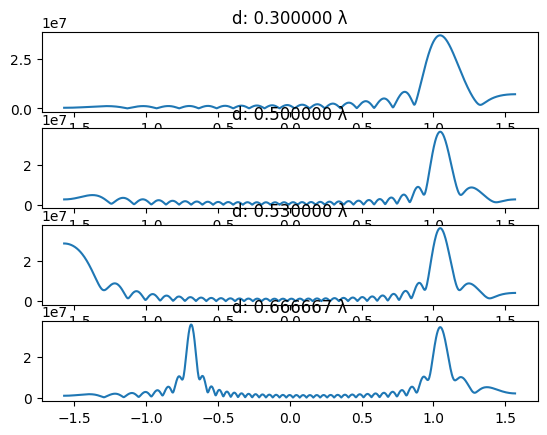

In [647]:
d1 = 0.3*lamd
PlotPa(r,d1,xip,xis,phi,4,1,1)

d3 = 0.5*lamd
PlotPa(r,d3,xip,xis,phi,4,1,2)

d2 = 0.53*lamd
PlotPa(r,d2,xip,xis,phi,4,1,3)

d4 = 2/3*lamd
PlotPa(r,d4,xip,xis,phi,4,1,4)

plt.show()